# XGBoost

In [2]:
from sklearn.model_selection import train_test_split
from sklearn.metrics import accuracy_score
from sklearn.preprocessing import LabelEncoder
from sklearn.metrics import mean_squared_error
import xgboost
from bayes_opt import BayesianOptimization
import numpy as np
import pandas as pd

## Sales

In [3]:
df= pd.read_excel('sample.xlsx')

In [36]:
df['category'].value_counts()

Moving Help           10000
Mounting              10000
Furniture Assembly    10000
Name: category, dtype: int64

In [40]:
df['hired'].corr(data['hourly_rate'])


-0.046519106252867579

In [41]:
df['hired'].corr(df['position'])


-0.21360830635792341

In [42]:
df['hired'].corr(df['num_completed_tasks'])

0.041824885364732896

In [4]:
df.columns.tolist()

['recommendation_id',
 'created_at',
 'tasker_id',
 'position',
 'hourly_rate',
 'num_completed_tasks',
 'hired',
 'category']

In [5]:
df.loc[:, 'created_at'] = pd.to_datetime(df['created_at'])
df.loc[:, 'created_at'] = df['created_at'].dt.date
df.loc[:, 'created_at'] = pd.to_datetime(df['created_at'])

#Expand feature list using Date Column

df['Month'] = df['created_at'].dt.month
df['Year'] = df['created_at'].dt.year
df['Quarter']= df['created_at'].dt.quarter
df['Week']= df['created_at'].dt.week
df['dayoftheweek']= df['created_at'].dt.dayofweek

#df = df.drop(['Quantity','Discount','Profit', 'Ship Date'], axis=1)
#df= df[df['Year']!=2014]

In [28]:
df.head(50)

,recommendation_id,created_at,tasker_id,position,hourly_rate,num_completed_tasks,hired,category,Month,Year,Quarter,Week,dayoftheweek
0,0-0-70cf97d7-37af-4834-901c-ce3ad4893b8c,2017-09-01,1009185352,1,38,151,0,Furniture Assembly,9,2017,3,35,4
1,0-0-70cf97d7-37af-4834-901c-ce3ad4893b8c,2017-09-01,1006892359,2,40,193,0,Furniture Assembly,9,2017,3,35,4
2,0-0-70cf97d7-37af-4834-901c-ce3ad4893b8c,2017-09-01,1012023956,3,28,0,0,Furniture Assembly,9,2017,3,35,4
3,0-0-70cf97d7-37af-4834-901c-ce3ad4893b8c,2017-09-01,1009733517,4,43,303,0,Furniture Assembly,9,2017,3,35,4
4,0-0-70cf97d7-37af-4834-901c-ce3ad4893b8c,2017-09-01,1013579273,5,29,39,0,Furniture Assembly,9,2017,3,35,4
5,0-0-70cf97d7-37af-4834-901c-ce3ad4893b8c,2017-09-01,1012043028,6,28,2,0,Furniture Assembly,9,2017,3,35,4
6,0-0-70cf97d7-37af-4834-901c-ce3ad4893b8c,2017-09-01,1013470741,7,29,9,0,Furniture Assembly,9,2017,3,35,4
7,0-0-70cf97d7-37af-4834-901c-ce3ad4893b8c,2017-09-01,1009557645,8,29,8,0,Furniture Assembly,9,2017,3,35,4
8,0-0-70cf97d7-37af-4834-901c-ce3ad4893b8c,2017-09-01,1010800768,9,28,0,0,Furniture Assembly,9,2017,3,35,4
9,0-0-70cf97d7-37af-4834-901c-ce3ad4893b8c,2017-09-01,1009072269,10,35,59,0,Furniture Assembly,9,2017,3,35,4


In [6]:
df.columns

Index(['recommendation_id', 'created_at', 'tasker_id', 'position',
       'hourly_rate', 'num_completed_tasks', 'hired', 'category', 'Month',
       'Year', 'Quarter', 'Week', 'dayoftheweek'],
      dtype='object')

In [7]:
df2 = df.copy()
df2.drop(['created_at'], axis=1, inplace=True)
df2.loc[:, 'hired'] = pd.to_numeric(df2['hired'])

In [8]:
df2.head(3)

,recommendation_id,tasker_id,position,hourly_rate,num_completed_tasks,hired,category,Month,Year,Quarter,Week,dayoftheweek
0,0-0-70cf97d7-37af-4834-901c-ce3ad4893b8c,1009185352,1,38,151,0,Furniture Assembly,9,2017,3,35,4
1,0-0-70cf97d7-37af-4834-901c-ce3ad4893b8c,1006892359,2,40,193,0,Furniture Assembly,9,2017,3,35,4
2,0-0-70cf97d7-37af-4834-901c-ce3ad4893b8c,1012023956,3,28,0,0,Furniture Assembly,9,2017,3,35,4


In [9]:
df2.dtypes

recommendation_id      object
tasker_id               int64
position                int64
hourly_rate             int64
num_completed_tasks     int64
hired                   int64
category               object
Month                   int64
Year                    int64
Quarter                 int64
Week                    int64
dayoftheweek            int64
dtype: object

In [10]:
sample= pd.get_dummies(data=df2, columns= df2.loc[:, df2.columns!= 'hired'].columns)

In [11]:
#Separate target variable and features
X, y = sample.loc[:, sample.columns!='hired'] , sample.loc[:, 'hired']
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=123)

y = y.astype(int)
y_train = y_train.astype(int)
y_test = y_test.astype(int)

In [0]:
#MODEL #1 Very Basic - W/ No fine-tuning whatsoever

data_dmatrix = xgboost.DMatrix(data=X,label=y)
xg_reg = xgboost.XGBRegressor(objective ='reg:linear', colsample_bytree = 0.3, learning_rate = 0.1, max_depth = 5, alpha = 10, n_estimators = 10)
xg_reg.fit(X_train, y_train)
preds1 = xg_reg.predict(X_test)
rmse = np.sqrt(mean_squared_error(y_test, preds1))
print("RMSE: %f" % (rmse))

#pd.DataFrame(preds1)
#pd.Series(preds1)

(((((y_test - preds1) / y_test) * 100).abs())-100).abs(), \
SMAPE(preds1, y_test)

In [0]:
def cv_boost(x_train):
    """Use CV function to tune hyperparameters and run cross-validation on our training dataset and returns a mean MAE score"""
    dtrain = xgboost.DMatrix(x_train, label=y_train, feature_names=list(x_train.columns))

    params = {'max_depth':4, 'objective': 'reg:logistic',
            'eta':0.085, 'gamma':10, 'silent':1, 'subsample':1}
    num_rounds = 10
    cv_results = xgboost.cv(params, dtrain, num_boost_round=num_rounds, nfold=5, metrics={'auc'}, early_stopping_rounds=5)
    return cv_results

cv_boost(X_train)

In [0]:
# USE CV TO FIND OPTIMAL max_depth and min_child_weight parameters

def cv_booster(x_train, y_train):
  
  dtrain = xgboost.DMatrix(x_train, label=y_train, feature_names=list(x_train.columns))
  params = {'max_depth':4, 'objective': 'reg:linear','eta':0.085, 'gamma':10, 'silent':1, 'subsample':1}
  num_rounds = 1500
  gridsearch_params = [ (max_depth, min_child_weight)
      for max_depth in range(9,12)
      for min_child_weight in range(5,8)]
  # Define initial best params and MAE
  min_mae = float("Inf")
  best_params = None
  for max_depth, min_child_weight in gridsearch_params:
    #print("CV with max_depth={}, min_child_weight={}".format(max_depth, min_child_weight))

    # Update our parameters
    params['max_depth'] = max_depth
    params['min_child_weight'] = min_child_weight
    # Run CV
    cv_results = xgboost.cv(params, dtrain, num_boost_round=num_rounds, metrics={'mae'}, early_stopping_rounds=10)

    # Update best MAE
    mean_mae = cv_results['test-mae-mean'].min()
    boost_rounds = cv_results['test-mae-mean'].idxmin()
    #print("\tMAE {} for {} rounds".format(mean_mae, boost_rounds))
    
    if mean_mae < min_mae:
      min_mae = mean_mae
      best_params = (max_depth, min_child_weight)
  #print("Best params: {}, {}, MAE: {}".format(best_params[0], best_params[1], min_mae))
  return best_params[0], best_params[1]

cv_booster(X_train, y_train)

In [0]:
#TESTING/ TWEAKING PARAMETERS

def xboost(x_train, y_train, x_test):
    """Trains xgboost model and returns predictions for x_test"""
    dtrain = xgboost.DMatrix(x_train, label=y_train, feature_names=list(x_train.columns))
    dtest = xgboost.DMatrix(x_test, feature_names=list(x_test.columns))

    params = {'max_depth':9, 'objective': 'reg:linear', #'eta':0.093 ----> 92.97% and SMAPE= 6.73
            'eta':0.199, 'gamma':10, 'min_child_weight':6,
            'silent':1, 'subsample':1 }

    """USE cv_booster function to get max_depth & min_child_weight"""
    params['max_depth'], params['min_child_weight'] = cv_booster(x_train, y_train) 

    num_rounds = 1500
    model = xgboost.train(params, dtrain, num_rounds)
    return pd.Series(model.predict(dtest))

##############################################################################
##############################################################################

def SMAPE(forecast, actual):
    """Returns the Symmetric Mean Absolute Percentage Error between two Series"""
    masked_arr = ~((forecast==0)&(actual==0))
    diff = abs(forecast[masked_arr] - actual[masked_arr])
    avg = (abs(forecast[masked_arr]) + abs(actual[masked_arr]))/2
    print('SMAPE Error Score: ' + str(round(sum(diff/avg)/len(forecast) * 100, 2)) + ' %')
    print(('Average Forecasting Accuracy: {} %').format(round((((((y_test - preds) / y_test) * 100).abs())-100).mean(), 2) * -1))

preds = xboost(X_train, y_train, X_test)
y_test= pd.Series(y_test, dtype='float32').reset_index(drop=True)

(((((y_test - preds) / y_test) * 100).abs())-100).abs().astype('float').round(2) \
, SMAPE(preds, y_test)

In [0]:
#Forecast Results (X_test, y_test, preds)
forecast_actual=pd.concat([X_test.reset_index(drop=True), pd.DataFrame(y_test), pd.DataFrame(preds)], axis=1).\
sort_values(by=['Year', 'Month', 'Quarter']).rename(columns={'gcp_billings':'actual_billings', 0:'Forecasted_billings'})
forecast_actual['Forecast_Accuracy']=(((((forecast_actual.actual_billings - forecast_actual.Forecasted_billings) / forecast_actual.actual_billings) * 100).abs())-100).abs()
forecast_actual['Forecast_Accuracy'] = forecast_actual['Forecast_Accuracy'].astype('float').round(2)
forecast_actual

In [0]:
pd.DataFrame(preds)

In [0]:
y_test

In [0]:
X_test

In [0]:
pd.DataFrame(xboost(X_train, y_train, X_test)).reset_index()

In [0]:
np.sqrt(mean_squared_error(preds, y_test))

## Bayesian Optimization

In [19]:
def train_model(max_depth, 
                ntrees,
                min_rows, 
                learn_rate, 
                sample_rate, 
                col_sample_rate):
    params = {
        'objective': "binary:logistic",
        'max_depth': int(max_depth),
        'ntrees': int(ntrees),
        'min_rows': int(min_rows),
        'learn_rate':learn_rate,
        'sample_rate':sample_rate,
        'col_sample_rate':col_sample_rate}
    
    dtrain = xgboost.DMatrix(X_train, label=y_train, feature_names=list(X_train.columns))
    num_rounds = 50
    
    cv_score = xgboost.cv(params, dtrain, num_boost_round=num_rounds, metrics={'auc'}, early_stopping_rounds=10)
    return cv_score['test-auc-mean'].iloc[-1]
  
bounds = {'max_depth':(5,10),
    'ntrees': (100,500),
    'min_rows':(10,30),
    'learn_rate':(0.001, 0.01),
    'sample_rate':(0.5,0.8),
    'col_sample_rate':(0.5,0.8)}

In [20]:
optimizer = BayesianOptimization(
    f=train_model,
    pbounds=bounds,
    random_state=1,
)
optimizer.maximize(init_points=10, n_iter=10)

|   iter    |  target   | col_sa... | learn_... | max_depth | min_rows  |  ntrees   | sample... |
-------------------------------------------------------------------------------------------------
|  1        |  0.8247   |  0.6251   |  0.007483 |  5.001    |  16.05    |  158.7    |  0.5277   |
|  2        |  0.8302   |  0.5559   |  0.00411  |  6.984    |  20.78    |  267.7    |  0.7056   |
|  3        |  0.8247   |  0.5613   |  0.008903 |  5.137    |  23.41    |  266.9    |  0.6676   |
|  4        |  0.833    |  0.5421   |  0.002783 |  9.004    |  29.37    |  225.4    |  0.7077   |
|  5        |  0.8247   |  0.7629   |  0.009051 |  5.425    |  10.78    |  167.9    |  0.7634   |
|  6        |  0.833    |  0.5295   |  0.00479  |  9.789    |  20.66    |  376.8    |  0.5947   |
|  7        |  0.8247   |  0.706    |  0.008512 |  5.091    |  25.0     |  495.5    |  0.7244   |
|  8        |  0.8247   |  0.5841   |  0.008104 |  5.516    |  18.96    |  463.4    |  0.5881   |
|  9        |  0.824

In [21]:
optimizer.max

# {'params': {'col_sample_rate': 0.54211608157857016,
#   'learn_rate': 0.0027829134017639092,
#   'max_depth': 9.0037228433776839,
#   'min_rows': 29.365231514387951,
#   'ntrees': 225.36967126369714,
#   'sample_rate': 0.70769678470079422},
#  'target': 0.83300033333333323}

{'params': {'col_sample_rate': 0.54211608157857016,
  'learn_rate': 0.0027829134017639092,
  'max_depth': 9.0037228433776839,
  'min_rows': 29.365231514387951,
  'ntrees': 225.36967126369714,
  'sample_rate': 0.70769678470079422},
 'target': 0.83300033333333323}

In [14]:
params= optimizer.max['params']
params['max_depth'] = int(params['max_depth'])

In [0]:
#params = optimizer.res['max']['max_params']
pd.Series(model.predict(dtest))

In [15]:
"""Trains xgboost model and returns predictions for x_test"""

dtest = xgboost.DMatrix(X_test, feature_names=list(X_test.columns))
dtrain = xgboost.DMatrix(X_train, label=y_train, feature_names=list(X_train.columns))

#params = optimizer.res['max']['max_params'] 

num_rounds = 1500
model = xgboost.train(params, dtrain, num_rounds)
pd.Series(model.predict(dtest))

##############################################################################
##############################################################################

#preds = xboost(X_train, y_train, X_test)

0      -0.001325
1      -0.000506
2      -0.001426
3      -0.007555
4      -0.004985
5       0.002742
6       0.024224
7      -0.000638
8       0.024026
9       0.000763
10     -0.008307
11     -0.003225
12      0.003833
13     -0.012692
14      0.000807
15      0.000598
16     -0.001801
17     -0.007637
18      0.004707
19     -0.001706
20      0.006491
21     -0.000615
22     -0.005345
23      0.002320
24      0.001540
25      0.022418
26     -0.003770
27      0.076661
28      0.006861
29      0.001958
          ...   
5970   -0.012219
5971    0.013631
5972    0.009039
5973    0.008147
5974    0.689018
5975    0.005047
5976    0.003662
5977   -0.006835
5978    0.003268
5979    0.002762
5980   -0.002151
5981   -0.005673
5982   -0.003715
5983   -0.001123
5984   -0.001184
5985    0.002436
5986   -0.000191
5987    0.010921
5988    0.001927
5989   -0.008498
5990   -0.001805
5991    0.001214
5992    0.003806
5993   -0.011379
5994    0.002113
5995    0.000968
5996   -0.001936
5997    0.0081

In [16]:
preds = pd.Series(model.predict(dtest))

preds[preds > 0.5] = 1
preds[preds <= 0.5] = 0
preds=preds.astype(int)

In [17]:
X_test

,recommendation_id_0-0-00033225-3f89-47dd-b4f1-5d1feb359a76,recommendation_id_0-0-000ea7f0-2ad9-48ee-bc79-899ee439be82,recommendation_id_0-0-0027ac52-1983-4130-8a65-5048dda560c9,recommendation_id_0-0-003a3672-3c80-4134-b409-b80baee0e082,recommendation_id_0-0-0045d200-f7c0-4fe6-94df-b89a4cde3ee7,recommendation_id_0-0-0046a0f0-1d70-42e4-a6d3-43e9a4c614d9,recommendation_id_0-0-004cc112-d2ee-4753-8e55-76e95369364e,recommendation_id_0-0-00549753-28f1-4291-b176-e1bec0d77b0e,recommendation_id_0-0-006326c7-5448-48fe-8e08-55d0fdfb9fe2,recommendation_id_0-0-006fe8d8-309a-4f2f-ae14-2936321fc19d,...,Week_37,Week_38,Week_39,dayoftheweek_0,dayoftheweek_1,dayoftheweek_2,dayoftheweek_3,dayoftheweek_4,dayoftheweek_5,dayoftheweek_6
25665,0,0,0,0,0,0,0,0,0,0,...,0,0,1,0,0,1,0,0,0,0
16464,0,0,0,0,0,0,0,0,0,0,...,0,1,0,0,1,0,0,0,0,0
22386,0,0,0,0,0,0,0,0,0,0,...,0,1,0,0,0,0,0,0,0,1
10149,0,0,0,0,0,0,0,0,0,0,...,1,0,0,1,0,0,0,0,0,0
8729,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,1
25295,0,0,0,0,0,0,0,0,0,0,...,0,0,1,0,0,1,0,0,0,0
8876,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,1
12348,0,0,0,0,0,0,0,0,0,0,...,1,0,0,0,0,0,1,0,0,0
3858,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,1,0,0,0,0,0
19209,0,0,0,0,0,0,0,0,0,0,...,0,1,0,0,0,0,1,0,0,0


In [18]:
y_test

25665    0
16464    0
22386    0
10149    0
8729     0
25295    0
8876     1
12348    0
3858     0
19209    0
120      0
12962    0
9346     0
12609    0
29679    0
14091    0
7661     0
3382     0
3588     0
29494    0
4582     0
6154     0
15161    0
15041    0
28665    0
22975    0
7396     0
7008     1
11478    0
1112     0
        ..
2006     0
16022    0
24996    1
14905    0
2215     0
11924    0
22294    0
21438    0
20111    0
5396     0
28930    0
16883    0
18474    0
22402    1
25385    0
3872     0
8353     0
29121    0
25161    0
19287    0
2508     0
6470     0
14439    0
20664    0
6453     0
9940     0
11351    0
29732    0
9088     0
23862    0
Name: hired, Length: 6000, dtype: int64

In [ ]:
#y_test= pd.Series(y_test, dtype='int').reset_index(drop=True)

In [19]:
accuracy_score(preds, y_test), 1-accuracy_score(preds, y_test)


(0.94316666666666671, 0.056833333333333291)

In [25]:
pd.options.display.max_rows = 6000

In [26]:
pd.concat((X_test, y_test), axis=1)

,recommendation_id_0-0-00033225-3f89-47dd-b4f1-5d1feb359a76,recommendation_id_0-0-000ea7f0-2ad9-48ee-bc79-899ee439be82,recommendation_id_0-0-0027ac52-1983-4130-8a65-5048dda560c9,recommendation_id_0-0-003a3672-3c80-4134-b409-b80baee0e082,recommendation_id_0-0-0045d200-f7c0-4fe6-94df-b89a4cde3ee7,recommendation_id_0-0-0046a0f0-1d70-42e4-a6d3-43e9a4c614d9,recommendation_id_0-0-004cc112-d2ee-4753-8e55-76e95369364e,recommendation_id_0-0-00549753-28f1-4291-b176-e1bec0d77b0e,recommendation_id_0-0-006326c7-5448-48fe-8e08-55d0fdfb9fe2,recommendation_id_0-0-006fe8d8-309a-4f2f-ae14-2936321fc19d,...,Week_38,Week_39,dayoftheweek_0,dayoftheweek_1,dayoftheweek_2,dayoftheweek_3,dayoftheweek_4,dayoftheweek_5,dayoftheweek_6,hired
25665,0,0,0,0,0,0,0,0,0,0,...,0,1,0,0,1,0,0,0,0,0
16464,0,0,0,0,0,0,0,0,0,0,...,1,0,0,1,0,0,0,0,0,0
22386,0,0,0,0,0,0,0,0,0,0,...,1,0,0,0,0,0,0,0,1,0
10149,0,0,0,0,0,0,0,0,0,0,...,0,0,1,0,0,0,0,0,0,0
8729,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,1,0
25295,0,0,0,0,0,0,0,0,0,0,...,0,1,0,0,1,0,0,0,0,0
8876,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,1,1
12348,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,1,0,0,0,0
3858,0,0,0,0,0,0,0,0,0,0,...,0,0,0,1,0,0,0,0,0,0
19209,0,0,0,0,0,0,0,0,0,0,...,1,0,0,0,0,1,0,0,0,0


In [ ]:
#forecast_actual=
pd.concat([X_test.reset_index(drop=True), pd.DataFrame(y_test), pd.DataFrame(preds)], axis=1)\
.rename(columns={0:'predicted_hires'})

# Correlation

In [64]:
%matplotlib inline

In [52]:
import matplotlib.pyplot as plt
import seaborn as sns

In [60]:
moving_help = data[data['category']=='Moving Help']

#### Number of completed tasks has the strongest positive correlation with the hourly rate followed by the position

In [61]:
# We pass 'pearson' as the method for calculating our correlation
moving_help.corr(method='pearson')

,tasker_id,position,hourly_rate,num_completed_tasks,hired,Month,Year,Quarter,Week,dayoftheweek
tasker_id,1.000000,0.014236,-0.021963,-0.294958,0.025814,NaN,NaN,NaN,0.027421,0.008956
position,0.014236,1.000000,0.269723,0.065283,-0.212856,NaN,NaN,NaN,0.000978,-0.009878
hourly_rate,-0.021963,0.269723,1.000000,0.273183,-0.095774,NaN,NaN,NaN,-0.024625,0.020365
num_completed_tasks,-0.294958,0.065283,0.273183,1.000000,0.012953,NaN,NaN,NaN,-0.024381,-0.000822
hired,0.025814,-0.212856,-0.095774,0.012953,1.000000,NaN,NaN,NaN,0.002280,0.001049
Month,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
Year,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
Quarter,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
Week,0.027421,0.000978,-0.024625,-0.024381,0.002280,NaN,NaN,NaN,1.000000,-0.238620
dayoftheweek,0.008956,-0.009878,0.020365,-0.000822,0.001049,NaN,NaN,NaN,-0.238620,1.000000


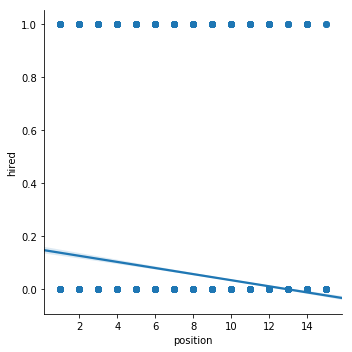

In [66]:
sns.lmplot(x='position', y='hired', data=moving_help)

In [44]:
# we store the correlation matrix output in a variable
pearson = data.corr(method='pearson')

# assume target attr is the last, then remove corr with itself
corr_with_target = pearson.iloc[-1][:-1]

# attributes sorted from the most predictive
corr_with_target.sort_values(ascending=False)

hired                 -0.001419
position              -0.003734
tasker_id             -0.005160
hourly_rate           -0.006643
num_completed_tasks   -0.029975
Week                  -0.257320
Month                       NaN
Year                        NaN
Quarter                     NaN
Name: dayoftheweek, dtype: float64

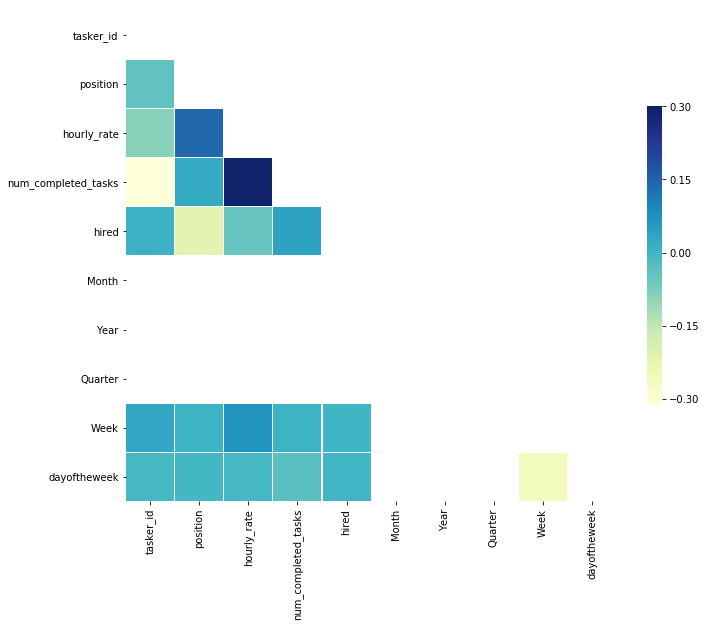

In [67]:
correlation = moving_help.corr(method='pearson')

f, ax = plt.subplots(figsize=(11, 11))

# Generate a mask for the upper triangle
# np.zeros_like - Return an array of zeros with the same shape and type as a given array
# In this case we pass the correlation matrix
# we create a variable “mask” which is a 14 X 14 numpy array

mask = np.zeros_like(pearson, dtype=np.bool)
tt = np.triu_indices_from(mask)

# We create a tuple with triu_indices_from() by passing the “mask” array
# k is used to offset diagonal
# with k=0, we offset all diagnoals
# If we put k=13, means we offset 14-13=1 diagonal

# triu_indices_from() Return the indices for the upper-triangle of arr.
mask[np.triu_indices_from(mask, k=0)] = True

# First 2 param - anchor hues for negative and positive extents of the map.
# 3rd param - Anchor saturation for both extents of the map
# If true, return a matplotlib colormap object rather than a list of colors.

cmap = sns.diverging_palette(10, 129, s=50, as_cmap=True)

# Adjust size of the legend bar with cbar_kws={“shrink”: 0.5}
# cmap=“YlGnBu” gives the color from Yellow-Green-Blue palette

sns.heatmap(pearson, mask=mask, cmap="YlGnBu", vmax=.3, center=0,
           square=True, linewidths=.1, cbar_kws={"shrink": 0.5})

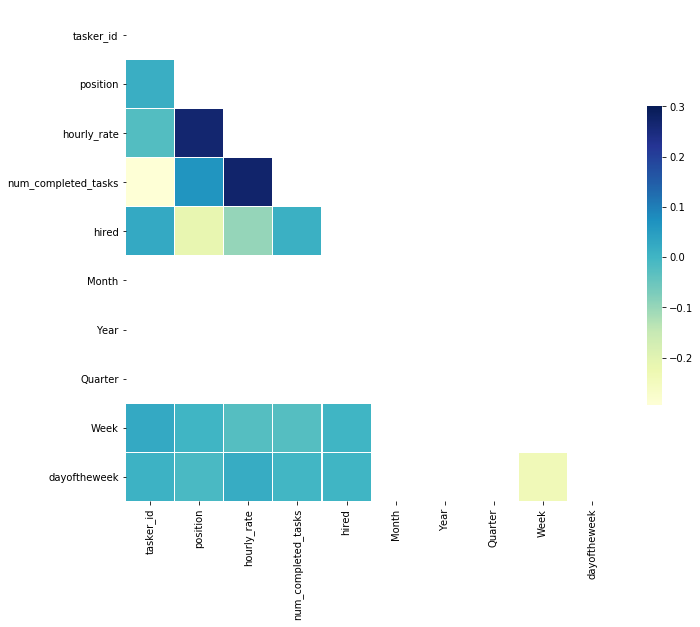

In [68]:
# Generate a mask for the upper triangle
# np.zeros_like - Returns an array of zeros with the same shape and type as per given array
# In this case we pass the correlation matrix
# we create a variable "mask" which is a 14 X 14 numpy array
mask = np.zeros_like(correlation, dtype=np.bool)

# We create a tuple with triu_indices_from() by passing the "mask" array
# k is used to offset diagonal
# with k=0, we offset all diagnoals
# If we put k=13, means we offset 14-13=1 diagonal 

# triu_indices_from() Return the indices for the upper-triangle of arr.
mask[np.triu_indices_from(mask, k=0)] = True

# Setting the plot size
fig, axis = plt.subplots(figsize=(11, 11))

# cbar_kws={"shrink": 0.5} is shrinking the legend color bar
sns.heatmap(correlation,  mask=mask, cmap="YlGnBu", vmax=.3, center=0,square=True, linewidths=.1, cbar_kws={"shrink": 0.5})

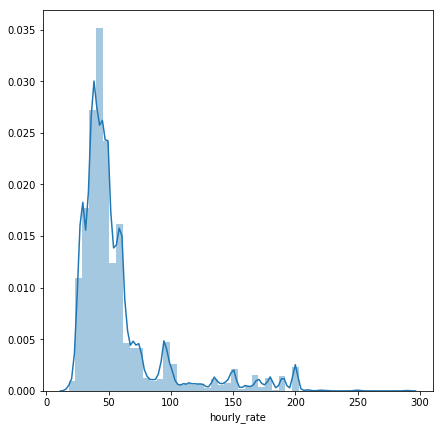

In [69]:
# Setting the plot size
fig, axis = plt.subplots(figsize=(7, 7))

# We use kde=True to plot the gaussian kernel density estimate
sns.distplot(data['hourly_rate'], bins=50, kde=True)

# **Plot Feature Importance**

In [29]:
import matplotlib.pyplot as plt
pd.set_option('display.max_rows', 5000)
%matplotlib inline
import seaborn as sns

In [89]:
data['category'].value_counts()

Moving Help           10000
Mounting              10000
Furniture Assembly    10000
Name: category, dtype: int64

In [84]:
moving_help.head(5)

,tasker_id,position,hourly_rate,num_completed_tasks,hired,Month,Year,Quarter,Week,dayoftheweek
created_at,,,,,,,,,,
2017-09-01,1014201297,1,49,61,0,9,2017,3,35,4
2017-09-01,1013172333,2,30,1,0,9,2017,3,35,4
2017-09-01,1011985968,3,32,0,1,9,2017,3,35,4
2017-09-01,1014725966,4,60,136,0,9,2017,3,35,4
2017-09-01,1012007145,5,32,0,0,9,2017,3,35,4


**Moving Help**

In [82]:
moving_help = data[data['category']=='Moving Help']
moving_help.drop(['recommendation_id', 'category'],axis=1, inplace= True)

X, y = moving_help.loc[:, moving_help.columns!='hired'] , moving_help.loc[:, 'hired']
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=123)
y = y.astype(int)
y_train = y_train.astype(int)
y_test = y_test.astype(int)

"""Trains xgboost model and returns predictions for x_test"""
dtest = xgboost.DMatrix(X_test, feature_names=list(X_test.columns))
dtrain = xgboost.DMatrix(X_train, label=y_train, feature_names=list(X_train.columns))

num_rounds = 1500
model = xgboost.train(params, dtrain, num_rounds)
sns.set(font_scale = 1.5)
xgboost.plot_importance(model)

/Users/gibranhasan/anaconda3/lib/python3.6/site-packages/ipykernel_launcher.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  """Entry point for launching an IPython kernel.


**Mounting**

/Users/gibranhasan/anaconda3/lib/python3.6/site-packages/ipykernel_launcher.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  


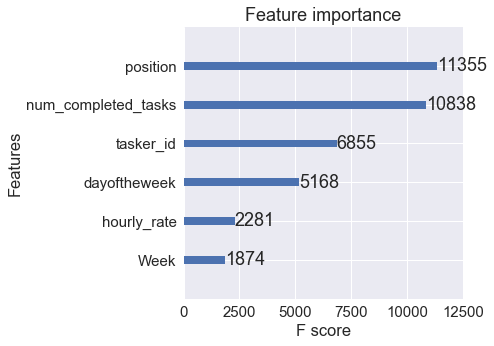

In [90]:
mounting = data[data['category']=='Mounting']
mounting.drop(['recommendation_id', 'category'],axis=1, inplace= True)

X, y = mounting.loc[:, mounting.columns!='hired'] , mounting.loc[:, 'hired']
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=123)
y = y.astype(int)
y_train = y_train.astype(int)
y_test = y_test.astype(int)

"""Trains xgboost model and returns predictions for x_test"""
dtest = xgboost.DMatrix(X_test, feature_names=list(X_test.columns))
dtrain = xgboost.DMatrix(X_train, label=y_train, feature_names=list(X_train.columns))

num_rounds = 1500
model = xgboost.train(params, dtrain, num_rounds)
sns.set(font_scale = 1.5)
xgboost.plot_importance(model)

**Furniture**

/Users/gibranhasan/anaconda3/lib/python3.6/site-packages/ipykernel_launcher.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  


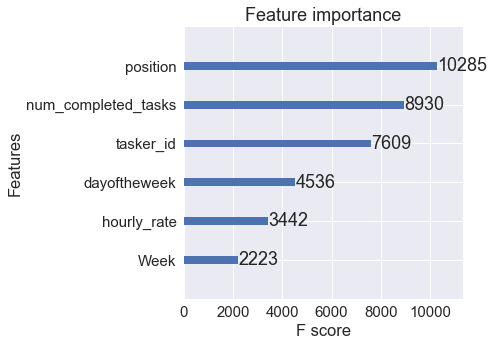

In [91]:
furniture = data[data['category']=='Furniture Assembly']
furniture.drop(['recommendation_id', 'category'],axis=1, inplace= True)

X, y = furniture.loc[:, furniture.columns!='hired'] , furniture.loc[:, 'hired']
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=123)
y = y.astype(int)
y_train = y_train.astype(int)
y_test = y_test.astype(int)
"""Trains xgboost model and returns predictions for x_test"""

dtest = xgboost.DMatrix(X_test, feature_names=list(X_test.columns))
dtrain = xgboost.DMatrix(X_train, label=y_train, feature_names=list(X_train.columns))

num_rounds = 1500
model = xgboost.train(params, dtrain, num_rounds)
sns.set(font_scale = 1.5)
xgboost.plot_importance(model)

#### The graphs show us that the two most important features are: position & num_completed_tasks

In [0]:
#Forecast Results (X_test, y_test, preds)
forecast_actual=pd.concat([X_test.reset_index(drop=True), pd.DataFrame(y_test), pd.DataFrame(preds)], axis=1).\
sort_values(by=['Year', 'Month', 'Quarter']).rename(columns={'sales':'actual_sales', 0:'Forecasted_sales'})
forecast_actual['Forecast_Accuracy']=(((((forecast_actual.actual_sales - forecast_actual.Forecasted_sales) / forecast_actual.actual_sales) * 100).abs())-100).abs()
forecast_actual['Forecast_Accuracy'] = forecast_actual['Forecast_Accuracy'].astype('float').round(2)
forecast_actual

## Prediction for Future Data

#### Only going to be using Furniture jobs for this example, ideally it would be better to include all categories and then one hot encode them but this way it's just quicker since this dataset is large

In [31]:
df.head(4)

,recommendation_id,created_at,tasker_id,position,hourly_rate,num_completed_tasks,hired,category,Month,Year,Quarter,Week,dayoftheweek
0,0-0-70cf97d7-37af-4834-901c-ce3ad4893b8c,2017-09-01,1009185352,1,38,151,0,Furniture Assembly,9,2017,3,35,4
1,0-0-70cf97d7-37af-4834-901c-ce3ad4893b8c,2017-09-01,1006892359,2,40,193,0,Furniture Assembly,9,2017,3,35,4
2,0-0-70cf97d7-37af-4834-901c-ce3ad4893b8c,2017-09-01,1012023956,3,28,0,0,Furniture Assembly,9,2017,3,35,4
3,0-0-70cf97d7-37af-4834-901c-ce3ad4893b8c,2017-09-01,1009733517,4,43,303,0,Furniture Assembly,9,2017,3,35,4


In [33]:
data = df.copy()
data.set_index(keys='created_at', inplace=True)

first_job= data[data['category']=='Furniture Assembly']
first_job = first_job.drop(['recommendation_id', 'category'], axis=1)

#Separate target variable and features

X, y = first_job.loc[:, first_job.columns!='hourly_rate'] , first_job.loc[:, 'hourly_rate']
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=123)

y = y.astype(int)
y_train = y_train.astype(int)
y_test = y_test.astype(int)

In [166]:
"""Trains xgboost model and returns predictions for x_test(first three jobs)"""

dtest = xgboost.DMatrix(X_test, feature_names=list(X_test.columns))
dtrain = xgboost.DMatrix(X_train, label=y_train, feature_names=list(X_train.columns))

#params = optimizer.res['max']['max_params'] 

num_rounds = 100
model = xgboost.train(params, dtrain, num_rounds)
preds=pd.Series(model.predict(dtest))
preds

0        26.118900
1        47.520279
2        79.816345
3        43.307751
4        39.792973
5        40.035957
6        37.479931
7        29.053741
8        30.607538
9        33.755466
10       59.823139
11       39.625771
12       41.639660
13       40.078583
14       35.100182
15       44.588615
16       36.543655
17       34.906471
18       25.532185
19       36.880852
20       45.059086
21       35.399357
22       58.679966
23       25.310255
24       40.096886
25       47.547829
26       35.004147
27       48.116219
28       39.951660
29       44.894699
30       40.052887
31       42.915928
32       29.897366
33       44.633739
34       27.435005
35       39.991463
36       40.935677
37       39.707775
38       39.961632
39       40.000641
40       27.967266
41       29.180576
42       41.204208
43       33.914635
44       29.897366
45       37.042603
46       29.909040
47       43.923920
48       28.983881
49       40.216801
50       45.114895
51       45.016239
52       28.

In [165]:
#Compare to actual hire rates for the first three jobs.
y_test

created_at
2017-09-08     26
2017-09-02     47
2017-09-29     80
2017-09-01     43
2017-09-13     40
2017-09-08     40
2017-09-19     38
2017-09-01     29
2017-09-23     29
2017-09-14     34
2017-09-15     60
2017-09-19     40
2017-09-10     42
2017-09-13     40
2017-09-18     35
2017-09-02     45
2017-09-25     36
2017-09-08     35
2017-09-30     25
2017-09-05     37
2017-09-08     45
2017-09-14     36
2017-09-08     60
2017-09-28     25
2017-09-06     40
2017-09-08     48
2017-09-20     35
2017-09-03     50
2017-09-29     40
2017-09-20     45
2017-09-13     40
2017-09-22     43
2017-09-25     29
2017-09-27     44
2017-09-16     26
2017-09-06     40
2017-09-19     41
2017-09-24     40
2017-09-20     40
2017-09-15     40
2017-09-02     28
2017-09-09     29
2017-09-06     40
2017-09-16     32
2017-09-25     29
2017-09-09     37
2017-09-08     30
2017-09-19     45
2017-09-20     29
2017-09-20     40
2017-09-26     45
2017-09-25     45
2017-09-16     29
2017-09-15     42
2017-09-30     26

In [170]:
#Model Accuracy

predictions = [round(value) for value in preds]
accuracy = accuracy_score(y_test, predictions)
print("Accuracy: %.2f%%" % (accuracy * 100.0))

Accuracy: 73.10%


In [175]:
#Prediction for future dates for the same taskers

new_test = X_test.copy()
new_test.loc[:,'hired']=1
new_test.sort_index()

,tasker_id,position,num_completed_tasks,hired,Month,Year,Quarter,Week,dayoftheweek
created_at,,,,,,,,,
2017-09-01,1013862522,10,14,1,9,2017,3,35,4
2017-09-01,1009856900,14,914,1,9,2017,3,35,4
2017-09-01,1012043028,5,5,1,9,2017,3,35,4
2017-09-01,1009470613,8,512,1,9,2017,3,35,4
2017-09-01,1014960300,11,43,1,9,2017,3,35,4
2017-09-01,1010257931,7,838,1,9,2017,3,35,4
2017-09-01,1013307670,15,0,1,9,2017,3,35,4
2017-09-01,1009530281,9,311,1,9,2017,3,35,4
2017-09-01,1009185352,1,151,1,9,2017,3,35,4


In [172]:
#Create future data for 3 unique taskers and changing hiring status to 1 to predict new hourly rates accordingly
listOfSeries = [pd.Series([1009557645, 5, 11, 1, 9, 2019, 3, 35, 4], index=new_test.columns ) , \
                pd.Series([1008733253, 2, 70, 1, 9, 2019, 3, 35, 4], index=new_test.columns ) , \
                pd.Series([1013579273, 3, 41, 1, 9, 2019, 3, 35, 4], index=new_test.columns )] 
listOfSeries

[tasker_id              1009557645
 position                        5
 num_completed_tasks            11
 hired                           1
 Month                           9
 Year                         2019
 Quarter                         3
 Week                           35
 dayoftheweek                    4
 dtype: int64, tasker_id              1008733253
 position                        2
 num_completed_tasks            70
 hired                           1
 Month                           9
 Year                         2019
 Quarter                         3
 Week                           35
 dayoftheweek                    4
 dtype: int64, tasker_id              1013579273
 position                        3
 num_completed_tasks            41
 hired                           1
 Month                           9
 Year                         2019
 Quarter                         3
 Week                           35
 dayoftheweek                    4
 dtype: int64]

In [173]:
#Model suggestions for hourly rates
newtest = xgboost.DMatrix(listOfSeries, feature_names=list(new_test.columns))

pd.Series(model.predict(newtest))

0    32.219978
1    39.159096
2    29.269274
dtype: float32